In [1]:
import os
import cv2
#import pafy
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt
import keras
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Activation,Flatten
from keras.layers import LeakyReLU
from keras.layers import Conv2D, BatchNormalization, MaxPool2D, GlobalMaxPool2D,GlobalAveragePooling2D

from keras.layers import TimeDistributed, GRU, Dense, Dropout
from tensorflow.keras import regularizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model

from keras.callbacks import History
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras.engine import training
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dropout, Activation, Average
from keras.losses import categorical_crossentropy
from tensorflow.keras.utils import to_categorical
from tensorflow.python.framework.ops import Tensor
from typing import Tuple, List
import glob

In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    #Restrict Tensorflow to only allocate 6gb of memory on the first GPU
   try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0],
       [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=8192)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
   except RuntimeError as e:
       #virtual devices must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [3]:
import cv2
import os
import imageio
import imgaug.augmenters as iaa
import imgaug as ia

IMG_SIZE = 112
ColorChannels = 3

def video_to_frames(video):
    vidcap = cv2.VideoCapture(video)
    
    import math
    rate = math.floor(vidcap.get(3))
    count = 0
    
    ImageFrames = []
    while vidcap.isOpened():
        ID = vidcap.get(1)
        success, image = vidcap.read()
        
        if success:
            # skipping frames to avoid duplications 
            if (ID % 7 == 0):
#                 flip = iaa.Fliplr(1.0)
#                 zoom = iaa.Affine(scale=1.3)
#                 random_brightness = iaa.Multiply((1, 1.3))
#                 rotate = iaa.Affine(rotate=(-25, 25))
                
#                 image_aug = flip(image = image)
#                 image_aug = random_brightness(image = image_aug)
#                 image_aug = zoom(image = image_aug)
#                 image_aug = rotate(image = image_aug)
                
#                 rgb_img = cv2.cvtColor(image_aug, cv2.COLOR_BGR2RGB)
                resized = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
                normalized_frame = resized / 255
                ImageFrames.append(normalized_frame)
                
            count += 1
        else:
            break
    
    vidcap.release()
    
    return ImageFrames

In [4]:
CLASSES = ["NonViolence", "Violence"]

In [5]:
X_original = np.load("x_train_compiled.npy")
X_test = np.load("x_test_compiled.npy")
y_train = np.load("y_train_compiled.npy")
y_test = np.load("y_test_compiled.npy")

In [5]:
from keras.layers import Conv2D, BatchNormalization, \
    MaxPool2D, GlobalMaxPool2D,GlobalAveragePooling2D, SeparableConv2D

from keras.layers import TimeDistributed, GRU, Dense, Dropout
def main_model(IMAGE_HEIGHT , IMAGE_WIDTH):
    momentum = .9
    model = keras.Sequential()
    model.add(Conv2D(64, (3,3),strides=(1,1),input_shape=(IMAGE_HEIGHT , IMAGE_WIDTH, 3), padding='same', activation='relu'))
    model.add(BatchNormalization(momentum=momentum))
    model.add(MaxPool2D(padding="same"))
    
    model.add(Conv2D(64, (3,3),strides=(1,1),input_shape=(IMAGE_HEIGHT , IMAGE_WIDTH, 3), padding='same', activation='relu'))
    model.add(BatchNormalization(momentum=momentum))
    model.add(MaxPool2D(padding="same"))
    
    model.add(Conv2D(128, (5,5), padding='same', activation='relu'))
    model.add(BatchNormalization(momentum=momentum))
    model.add(MaxPool2D(padding='same'))
    
    model.add(Conv2D(128,(5,5),padding="same",activation="relu"))
    model.add(BatchNormalization(momentum=momentum))
    model.add(MaxPool2D(padding="same"))
    
    
    
    model.add(Conv2D(512, (3,3), padding='same', activation='relu'))
    model.add(BatchNormalization(momentum=momentum))
    model.add(MaxPool2D(padding='same'))
    model.add(Dropout(rate=0.5))
    
    model.add(Conv2D(1024, (5,5), padding='same', activation='relu'))
    model.add(BatchNormalization(momentum=momentum))
    model.add(MaxPool2D(padding='same'))
    
    model.add(Conv2D(1024, (5,5), padding='same', activation='relu'))
    model.add(BatchNormalization(momentum=momentum))
    model.add(MaxPool2D(padding='same'))
    
    
    # flatten...
    model.add(Flatten())
    
    model.add(Dense(2, activation='sigmoid'))
    return model

In [6]:
model = main_model(112,112)
optimizer = tf.optimizers.Adam(0.0001)

#containes adam_optimizer, SPC loss function
model.compile(
    optimizer,
    'sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [8]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 separable_conv2d (Separable  (None, 112, 112, 64)     283       
 Conv2D)                                                         
                                                                 
 batch_normalization (BatchN  (None, 112, 112, 64)     256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 56, 56, 64)       0         
 )                                                               
                                                                 
 separable_conv2d_1 (Separab  (None, 56, 56, 64)       4736      
 leConv2D)                                                       
                                                                 
 batch_normalization_1 (Batc  (None, 56, 56, 64)       2

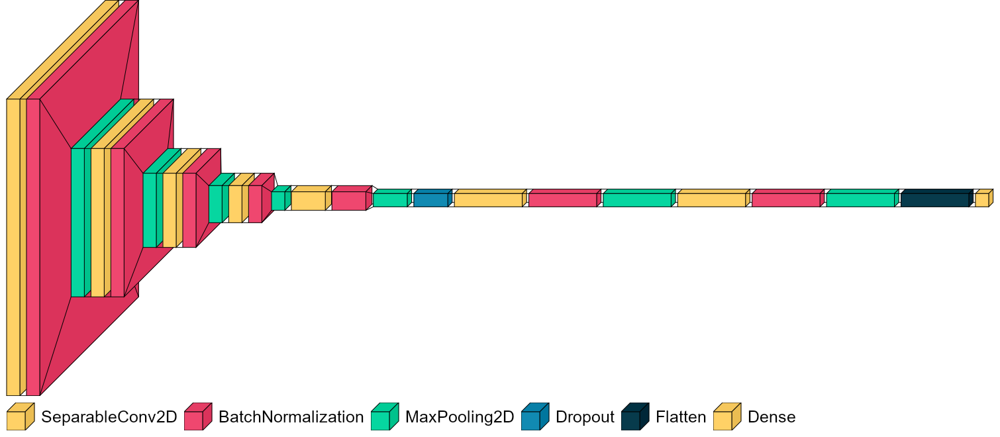

In [7]:
import visualkeras
from PIL import ImageFont

font = ImageFont.truetype("arial.ttf", 25)
visualkeras.layered_view(model,legend=True,font=font)

In [10]:
EPOCHS=80

checkpoint = ModelCheckpoint(filepath='manual_frames_compiled_reduced.hdf5', monitor='val_loss', verbose=0, save_weights_only=True,
                                                 save_best_only=True, mode='auto', period=1)

callbacks = [
    keras.callbacks.ReduceLROnPlateau(monitor ='val_loss',factor = 0.1,patience = 5,min_delta=0.02,verbose=1,min_lr=0.0000000001),
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        min_delta=0.02,
        patience=12,
        verbose=1,
        mode="auto",
        baseline=None,
        restore_best_weights=False,
    ),
    checkpoint
]
history = model.fit(
    X_original ,y_train,
    validation_split = 0.20,
    verbose=1,
    epochs=EPOCHS,
    batch_size = 3,
    callbacks=callbacks
)

Epoch 1/80
9259/9259 [==============================] - 107s 10ms/step - loss: 0.4333 - accuracy: 0.7973 - val_loss: 0.3479 - val_accuracy: 0.8576 - lr: 1.0000e-04
Epoch 2/80
9259/9259 [==============================] - 88s 10ms/step - loss: 0.2464 - accuracy: 0.9023 - val_loss: 0.1785 - val_accuracy: 0.9379 - lr: 1.0000e-04
Epoch 3/80
9259/9259 [==============================] - 88s 10ms/step - loss: 0.1766 - accuracy: 0.9332 - val_loss: 0.1309 - val_accuracy: 0.9528 - lr: 1.0000e-04
Epoch 4/80
9259/9259 [==============================] - 89s 10ms/step - loss: 0.1405 - accuracy: 0.9463 - val_loss: 0.0945 - val_accuracy: 0.9662 - lr: 1.0000e-04
Epoch 5/80
9259/9259 [==============================] - 89s 10ms/step - loss: 0.1121 - accuracy: 0.9589 - val_loss: 0.0806 - val_accuracy: 0.9702 - lr: 1.0000e-04
Epoch 6/80
9259/9259 [==============================] - 90s 10ms/step - loss: 0.1012 - accuracy: 0.9627 - val_loss: 0.0772 - val_accuracy: 0.9726 - lr: 1.0000e-04
Epoch 7/80
9259/9259 

In [11]:
model.save('spatial_compiled_separable.h5')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


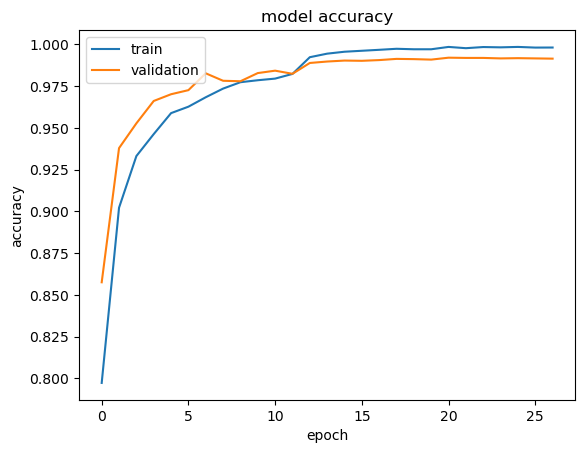

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


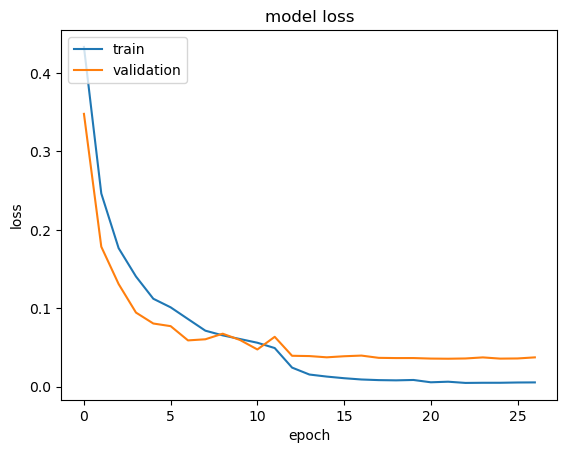

In [12]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.savefig('destination_path.eps', format='eps', dpi=1000)
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.savefig('destination_path1.eps', format='eps', dpi=1000)
plt.show()

In [7]:
model.load_weights('manual_frames1.hdf5')

In [14]:
predictions = model.predict(X_test)

121/121 [==============================] - 1s 7ms/step


In [15]:
preds = (predictions > 0.5).astype(int)


In [16]:
preds = np.argmax(preds,axis=1)


In [17]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(preds, y_test)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.991187143597719


> Correct Predictions: 3824
> Wrong Predictions: 34


C:\Users\User\AppData\Local\Temp\ipykernel_2484\3180812836.py:6: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  n_correct = np.int((corr_pred[0][0] + corr_pred[1][1]))
C:\Users\User\AppData\Local\Temp\ipykernel_2484\3180812836.py:8: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check 

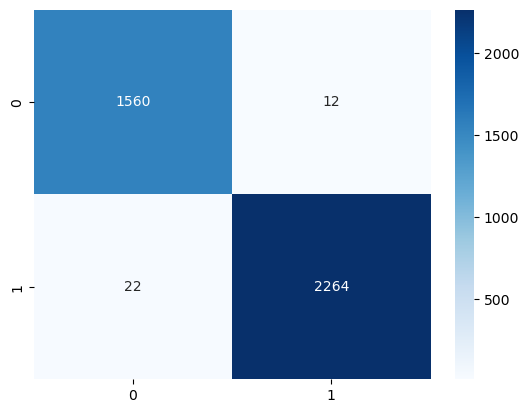

              precision    recall  f1-score   support

 NonViolence       0.99      0.99      0.99      1572
    Violence       0.99      0.99      0.99      2286

    accuracy                           0.99      3858
   macro avg       0.99      0.99      0.99      3858
weighted avg       0.99      0.99      0.99      3858



In [18]:
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import roc_curve, roc_auc_score, plot_roc_curve, accuracy_score, classification_report, confusion_matrix
corr_pred = metrics.confusion_matrix(y_test, preds)

n_correct = np.int((corr_pred[0][0] + corr_pred[1][1]))
print('> Correct Predictions:', n_correct)
n_wrongs = np.int((corr_pred[0][1] + (corr_pred[1][0])))
print('> Wrong Predictions:', n_wrongs)

sns.heatmap(corr_pred,annot=True, fmt="d",cmap="Blues")
plt.show()

print(metrics.classification_report(y_test, preds, 
                           target_names=["NonViolence", "Violence"]))

In [8]:
import numpy as np
import argparse
import pickle
import cv2
import os
import time
from keras.models import load_model
from collections import deque

def print_results(video, limit=None):
        fig=plt.figure(figsize=(16, 30))
        if not os.path.exists('output'):
            os.mkdir('output')

        print("Loading model ...")
#         model = model
        Q = deque(maxlen=128)

        vs = cv2.VideoCapture(video)
        writer = None
        (W, H) = (None, None)
        count = 0     
        while vs.isOpened():
            (grabbed, frame) = vs.read()
            ID = vs.get(1)
            if not grabbed:

                break
            try:
#                 if (ID % 7 == 0):

                count = count + 1
                n_frames = len(frame)

                if W is None or H is None:
                    (H, W) = frame.shape[:2]

                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

                output = cv2.resize(frame, (512, 360)).copy()
                frame = cv2.resize(frame, (112, 112)).astype("float32")
                frame = frame.reshape(IMG_SIZE, IMG_SIZE, 3) / 255
                predictions = model.predict(np.expand_dims(frame, axis=0))
                preds = (predictions > 0.5).astype(int)
                preds = np.argmax(preds,axis=1)
                Q.append(preds)

                results = np.array(Q).mean(axis=0)
                i = preds[0]
                label = (False if i == 0 else True)

                text = "Violence: {}".format(label)
                file = open("output.txt",'w')
                file.write(text)
                file.close()

                color = (0, 255, 0)

                if label:
                    color = (255, 0, 0) 
                else:
                    color = (0, 255, 0)

                cv2.putText(output, text, (35, 50), cv2.FONT_HERSHEY_SIMPLEX,
                        1, color, 3)


#                         saving mp4 with labels but cv2.imshow is not working with this notebook
                if writer is None:
                    fourcc = cv2.VideoWriter_fourcc(*"MJPG")
                    writer = cv2.VideoWriter("D:\\Thesis Works\\Datasets\\test_videos\\output\\output.mp4", fourcc, 60,
                            (512, 360), True)

                writer.write(output)
#                     cv2.imshow("Output", output)

                fig.add_subplot(8, 3, count)
                plt.imshow(output)

                if limit and count > limit:
                    break

            except:
                break 
        
        plt.show()
        print("Cleaning up...")
        writer.release()
        vs.release()
        cv2.destroyAllWindows()

In [52]:
def play(filename):
    html = ''
    video = open(filename,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

In [9]:
test1=f'D:\\Thesis Works\\Datasets\\test_videos\\nv_1.mp4'

In [10]:
print_results(test1, limit=30)

Loading model ...


<Figure size 1600x3000 with 0 Axes>

Cleaning up...


AttributeError: 'NoneType' object has no attribute 'release'

Loading model ...
1/1 [==============================] - 0s 22ms/step


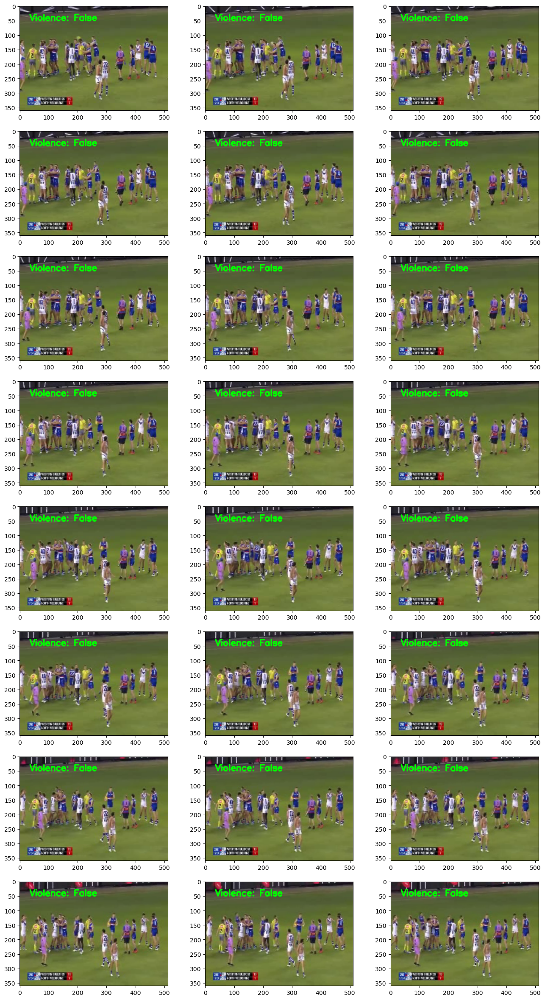

Cleaning up...


In [33]:
test2=f'D:\\Thesis Works\\Datasets\\compiled_short\\NonViolence\\NV_572.mp4'
print_results(test2, limit=30)

Loading model ...
1/1 [==============================] - 0s 22ms/step


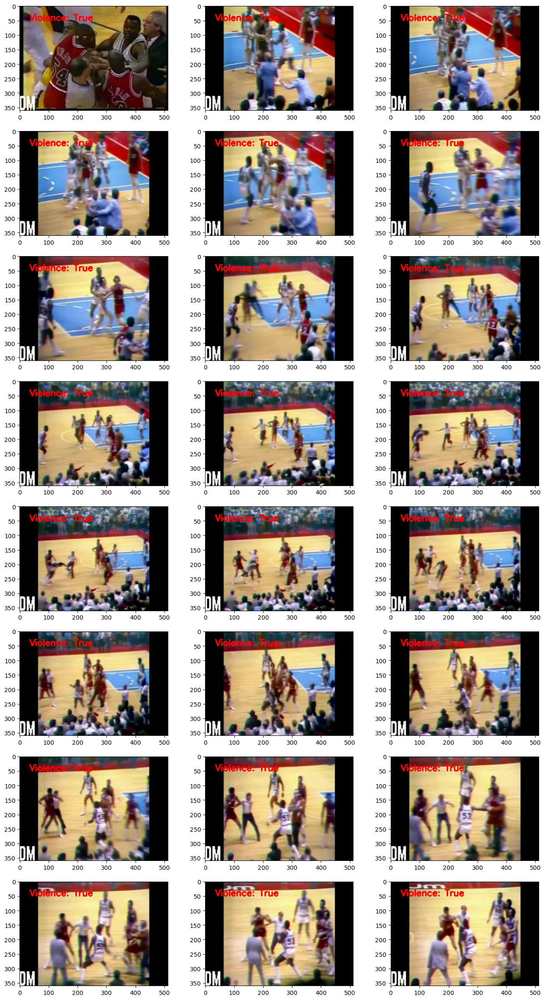

Cleaning up...


In [21]:
test3=f'D:\\Thesis Works\\Datasets\\RLVD\\Violence\\V_600.mp4'
print_results(test3, limit=30)

Loading model ...
1/1 [==============================] - 0s 21ms/step


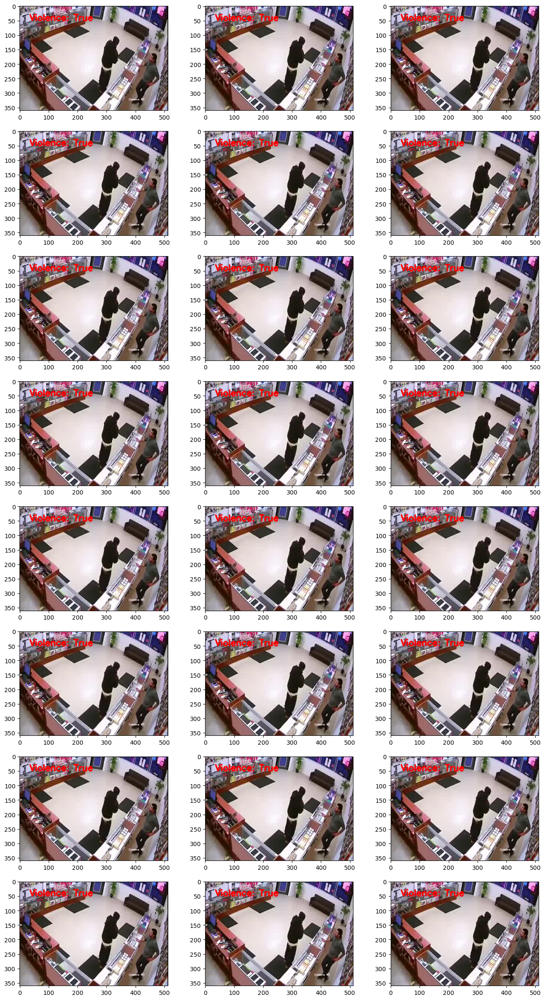

Cleaning up...


In [34]:
test4=f'D:\\Thesis Works\\Datasets\\compiled_short\\Violence\\WV72.mp4'
print_results(test4, limit=30)

Loading model ...
1/1 [==============================] - 0s 21ms/step


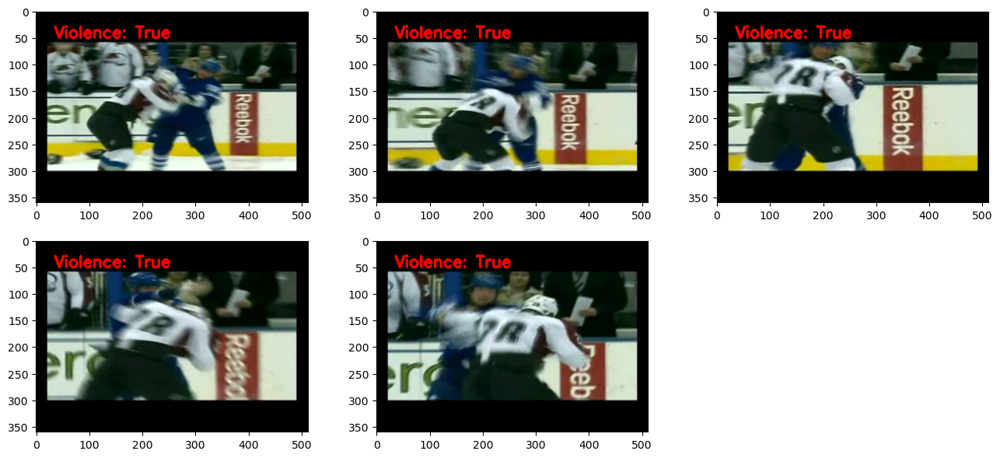

Cleaning up...


In [23]:
test5=f'D:\\Thesis Works\\Datasets\\compiled_short\\Violence\\fi117_xvid.avi'
print_results(test5, limit=30)